**<center> <span style="color:#0F52BA;font-family:serif; font-size:32px;"> MUSIC GENERE CLASSIFICATION 🎵</span> </center>**


![Alt text](kaggle_54772_logos_header(1).png)


# <span style="font-family:serif; font-size:40px;"> Content</span>

1. <span style="font-size:30px;">[Introduction](#1)</span>
    * <span style="font-size:30px;">[Columns Understanding](#2)</span>
    
2. <span style="font-size:30px;">[Loading libraries and Data](#3)</span>  

3. <span style="font-size:30px;">[Exploring Data](#5)</span>

4. <span style="font-size:30px;">[General Analysis](#6)</span>

5. <span style="font-size:30px;">[Train vs Test](#7)</span>

6. <span style="font-size:30px;">[Building Model and Pipeline](#8)</span>


# <span style="color:#0F52BA; font-family:serif; font-size:35px;">Introduction</span>

This dataset provides comprehensive information about various songs and their characteristics, sourced from a popular music platform. Each row in the dataset represents a song, and the columns provide details on various musical features, including acousticness, danceability, energy, and more.

### Key Highlights:
- The dataset is designed to help analyze the musical attributes of songs and their popularity.
- It contains a combination of numerical and categorical data, offering opportunities for exploratory data analysis, feature engineering, and model building.
- With information on over [N] songs, it provides valuable insights into the relationship between song features and their popularity.


<a id="2"></a>
# <span style="color:#0F52BA; font-family:serif; font-size:30px;">Columns Understanding</span>

- **artist**: Name of the Artist.

- **song**: Name of the Track.

- **popularity**: The higher the value, the more popular the song is.

- **danceability**: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo and rhythm.

- **energy**: A measure from 0.0 to 1.0 that represents a perceptual measure of intensity and activity.

- **key**: The key the track is in. Integers map to pitches using standard Pitch Class notation. For example:  
  - 0 = C  
  - 1 = C♯/D♭  
  - 2 = D, and so on.

- **loudness**: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative volumes.

- **mode**: Indicates the modality (major or minor) of a track.  
  - 1 = Major  
  - 0 = Minor.

- **speechiness**: Detects the presence of spoken words in a track.  
  - Values closer to 1.0 represent more speech-like content (e.g., talk shows, audiobooks, poetry).  
  - Values above 0.66: Tracks made entirely of spoken words.  
  - Values between 0.33 and 0.66: Tracks may contain both music and speech (e.g., rap music).  
  - Values below 0.33: Mostly music with little to no speech-like content.

- **acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. A value of 1.0 represents high confidence that the track is acoustic.

- **instrumentalness**: Predicts whether a track contains no vocals.  
  - "Ooh" and "aah" sounds are treated as instrumental.  
  - The closer the instrumentalness value is to 1.0, the more likely the track contains no vocal content.  
  - Values above 0.5 are intended to represent instrumental tracks, with higher values indicating more confidence.

- **liveness**: Detects the presence of an audience in the recording.  
  - Higher values represent an increased probability that the track was performed live.  
  - A value above 0.8 provides strong likelihood that the track is live.

- **valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track.  
  - Higher valence values indicate more positive emotions (e.g., happy, cheerful).  
  - Lower values indicate negative emotions (e.g., sad, angry).

- **tempo**: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece of music.

- **duration (in milliseconds)**: Length of the track in milliseconds.

- **time_signature**: A notational convention used in Western music to specify how many beats are in each measure (bar) and which note value is equivalent to a beat.

- **Class**: The genre of the track.


# <span style="color:#0F52BA; font-family:serif; font-size:35px;">Loading Library and Data</span>


In [ ]:
#Analysis and Exploring Librarys...
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
import regex as re
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Model selection and metrics librarys
from sklearn.model_selection import StratifiedKFold,cross_val_score,cross_val_predict,train_test_split,RandomizedSearchCV, GridSearchCV,learning_curve
from sklearn.metrics import precision_recall_curve,accuracy_score,confusion_matrix,ConfusionMatrixDisplay,mean_absolute_error,mean_squared_error,roc_auc_score,roc_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.preprocessing import OneHotEncoder
# Some Machine Learning Models
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
from catboost import Pool,CatBoostClassifier
from sklearn.model_selection import RepeatedKFold

In [ ]:
df['danceability_energy'] = df['danceability'] * df['energy']
df['loudness_log'] = np.log1p(-df['loudness'])
df['duration_log'] = np.log1p(df['duration_in min/ms'])
df['acousticness_danceability'] = df['acousticness'] * df['danceability']

kmeans = KMeans(n_clusters=5, random_state=0)
df['cluster'] = kmeans.fit_predict(X)

In [ ]:
train = pd.read_csv("train (1).csv")
train

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,1,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,2,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,3,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,4,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,5,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,14392,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,14393,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,14394,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,14395,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
print(f'The Shape of Train--> {train.shape}') # train shape(rows,col)

The Shape of Train--> (14396, 18)


In [ ]:
test = pd.read_csv('test (2).csv') # test import
test

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
0,14397,Juan Pablo Vega,Matando (feat. Vic Mirallas),NaN,0.691,0.670,2.0,-7.093,0,0.0941,0.075700,0.035200,0.1970,0.635,89.965,200000.0,4
1,14398,Kappi Kat,Baarish,14.0,0.461,0.777,2.0,-7.469,1,0.0306,0.388000,0.923000,0.2910,0.525,163.043,283909.0,4
2,14399,Plain White T's,Hey There Delilah,80.0,0.656,0.291,2.0,-10.572,1,0.0293,0.872000,NaN,0.1140,0.298,103.971,232533.0,4
3,14400,WALK THE MOON,Different Colors,52.0,0.480,0.826,NaN,-4.602,1,0.0397,0.000797,0.000001,0.1250,0.687,96.000,222053.0,4
4,14401,Peled,◊ß◊®◊ô◊ñ,23.0,0.734,0.729,1.0,-6.381,0,0.2830,0.147000,NaN,0.0672,0.805,76.030,118439.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,17992,Within Temptation,Stand My Ground,55.0,0.271,0.866,5.0,-4.072,0,0.0578,0.048900,0.000762,0.1160,0.127,175.665,267987.0,4
3596,17993,Dikla,◊©◊ë◊ï◊¢◊ô◊ô◊ù,38.0,0.598,0.690,5.0,-4.758,0,0.3030,0.363000,NaN,0.0519,0.653,187.934,198300.0,4
3597,17994,Cut Copy,Hearts On Fire - Calvin Harris Remix,18.0,0.783,0.820,1.0,-6.102,1,0.0489,0.000540,0.499000,0.0628,0.235,129.015,339213.0,4
3598,17995,Jethro Tull,Thick as a Brick - Edit #1,38.0,0.443,0.401,5.0,-13.997,1,0.0426,0.263000,NaN,0.1680,0.751,168.209,182587.0,3


In [ ]:
print(f'The Shape of Test--> {test.shape}') # test shpae(rows,col)

The Shape of Test--> (3600, 17)


In [ ]:
train['Class'].value_counts() # So far good we have found some Values for Class

Class
10    3959
6     2069
9     2019
8     1483
5     1157
1     1098
2     1018
0      500
7      461
3      322
4      310
Name: count, dtype: int64

<a id="2"></a>
# <span style="color:#0F52BA; font-family:serif; font-size:30px;">Exploring Data</span>


In [ ]:
def info_df(df):
    nan_count = df.isna().sum() # Number of Null Values
    nan_perc= (nan_count / df.shape[0]) * 100 # Prec of Null Values
    dtype_df = df.dtypes # types for each col
    num_dup = df.apply(lambda x : x.duplicated().sum()) # Number of Duplicated in each col
    num_uni = df.apply(lambda x : len(x.unique())) # Number of unique values in each col

    info_data = pd.concat([nan_count,nan_perc,dtype_df,num_dup,num_uni],axis = 1).reset_index() #Now we concat all of them
    info_data.rename(columns = {0 : 'NaN Count' , 1:'Nan Perc',2:'Dtype',3:'num_dup',4:'num_uniq'},inplace= True) # just rename
    return info_data

In [ ]:
info_df(train).style.background_gradient()

,index,NaN Count,Nan Perc,Dtype,num_dup,num_uniq
0,Id,0,0.000000,int64,0,14396
1,Artist Name,0,0.000000,object,6483,7913
2,Track Name,0,0.000000,object,1941,12455
3,Popularity,333,2.313143,float64,14295,101
4,danceability,0,0.000000,float64,13509,887
5,energy,0,0.000000,float64,13240,1156
6,key,1609,11.176716,float64,14384,12
7,loudness,0,0.000000,float64,6345,8051
8,mode,0,0.000000,int64,14394,2
9,speechiness,0,0.000000,float64,13219,1177


In [ ]:
print(f"Number of Rows Duplicate in Train {train.duplicated().sum()}")

Number of Rows Duplicate in Train 0


In [ ]:
info_df(test).style.background_gradient()

,index,NaN Count,Nan Perc,Dtype,num_dup,num_uniq
0,Id,0,0.000000,int64,0,3600
1,Artist Name,0,0.000000,object,816,2784
2,Track Name,0,0.000000,object,128,3472
3,Popularity,95,2.638889,float64,3504,96
4,danceability,0,0.000000,float64,2842,758
5,energy,0,0.000000,float64,2710,890
6,key,405,11.250000,float64,3588,12
7,loudness,0,0.000000,float64,590,3010
8,mode,0,0.000000,int64,3598,2
9,speechiness,0,0.000000,float64,2661,939


In [ ]:
print(f"Number of Rows Duplicate in Test {test.duplicated().sum()}")

Number of Rows Duplicate in Test 0


In [ ]:
# Some statistical Info
print(50 * '#')
print(f'info {train.info()}')
print(50 * '#')
train.describe().style.background_gradient()


##################################################
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14396 entries, 0 to 14395
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  14396 non-null  int64  
 1   Artist Name         14396 non-null  object 
 2   Track Name          14396 non-null  object 
 3   Popularity          14063 non-null  float64
 4   danceability        14396 non-null  float64
 5   energy              14396 non-null  float64
 6   key                 12787 non-null  float64
 7   loudness            14396 non-null  float64
 8   mode                14396 non-null  int64  
 9   speechiness         14396 non-null  float64
 10  acousticness        14396 non-null  float64
 11  instrumentalness    10855 non-null  float64
 12  liveness            14396 non-null  float64
 13  valence             14396 non-null  float64
 14  tempo               14396 non-null  float64
 15  du

,Id,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
count,14396.000000,14063.000000,14396.000000,14396.000000,12787.000000,14396.000000,14396.000000,14396.000000,14396.000000,10855.000000,14396.000000,14396.000000,14396.000000,14396.000000,14396.000000,14396.000000
mean,7198.500000,44.525208,0.543105,0.662422,5.953781,-7.900852,0.640247,0.080181,0.246746,0.178129,0.195782,0.486379,122.695372,200094.222824,3.924354,6.695679
std,4155.911573,17.418940,0.165517,0.235967,3.200013,4.057362,0.479944,0.085157,0.310922,0.304266,0.159258,0.239476,29.538490,111689.098211,0.359520,3.206170
min,1.000000,1.000000,0.059600,0.001210,1.000000,-39.952000,0.000000,0.022500,0.000000,0.000001,0.011900,0.021500,30.557000,0.501650,1.000000,0.000000
25%,3599.750000,33.000000,0.432000,0.508000,3.000000,-9.538000,0.000000,0.034800,0.004280,0.000088,0.097275,0.299000,99.799000,165445.750000,4.000000,5.000000
50%,7198.500000,44.000000,0.545000,0.699000,6.000000,-7.013500,1.000000,0.047100,0.081450,0.003920,0.129000,0.480500,120.060000,208941.000000,4.000000,8.000000
75%,10797.250000,56.000000,0.658000,0.861000,9.000000,-5.162000,1.000000,0.083100,0.432250,0.201000,0.256000,0.672000,141.988250,252247.000000,4.000000,10.000000
max,14396.000000,100.000000,0.989000,1.000000,11.000000,1.342000,1.000000,0.955000,0.996000,0.996000,0.992000,0.986000,217.416000,1477187.000000,5.000000,10.000000


In [ ]:
# Some statistical Info
print(50 * '#')
print(f'info {test.info()}')
print(50 * '#')
test.describe().style.background_gradient()


##################################################
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  3600 non-null   int64  
 1   Artist Name         3600 non-null   object 
 2   Track Name          3600 non-null   object 
 3   Popularity          3505 non-null   float64
 4   danceability        3600 non-null   float64
 5   energy              3600 non-null   float64
 6   key                 3195 non-null   float64
 7   loudness            3600 non-null   float64
 8   mode                3600 non-null   int64  
 9   speechiness         3600 non-null   float64
 10  acousticness        3600 non-null   float64
 11  instrumentalness    2764 non-null   float64
 12  liveness            3600 non-null   float64
 13  valence             3600 non-null   float64
 14  tempo               3600 non-null   float64
 15  dura

,Id,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
count,3600.000000,3505.000000,3600.000000,3600.000000,3195.000000,3600.000000,3600.000000,3600.000000,3600.000000,2764.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000
mean,16196.500000,44.459629,0.544744,0.664197,5.947105,-7.949879,0.622778,0.077813,0.248425,0.175336,0.197720,0.485527,122.335063,203344.680475,3.922778
std,1039.374812,17.461328,0.169257,0.233010,3.184676,4.016468,0.484759,0.076914,0.309510,0.303238,0.159040,0.243082,29.705640,113159.251372,0.369936
min,14397.000000,1.000000,0.064600,0.000020,1.000000,-34.797000,0.000000,0.022700,0.000001,0.000001,0.014400,0.018300,48.718000,0.987117,1.000000
25%,15296.750000,33.000000,0.430000,0.512000,3.000000,-9.532500,0.000000,0.034800,0.004488,0.000093,0.098575,0.291000,98.515750,168836.000000,4.000000
50%,16196.500000,44.000000,0.549000,0.703000,6.000000,-7.043500,1.000000,0.048750,0.080850,0.003755,0.131000,0.481000,120.091000,210335.500000,4.000000
75%,17096.250000,56.000000,0.664000,0.859000,9.000000,-5.282250,1.000000,0.082800,0.441250,0.197250,0.265250,0.674000,141.846750,253395.750000,4.000000
max,17996.000000,97.000000,0.970000,0.999000,11.000000,1.355000,1.000000,0.886000,0.996000,0.973000,1.000000,0.984000,214.396000,1412451.000000,5.000000


In [ ]:
train

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,1,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,2,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,3,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,4,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,5,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,14392,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,14393,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,14394,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,14395,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
train.columns

Index(['Id', 'Artist Name', 'Track Name', 'Popularity', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_in min/ms', 'time_signature', 'Class'],
      dtype='object')

In [ ]:
cat_feature = ['Artist Name', 'Track Name', 'key', 'mode', 'time_signature', 'Class']

# Numerical columns
num_feature = ['Popularity', 'danceability', 'energy', 'loudness', 'speechiness',
                     'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
                     'duration_in min/ms']

df_train = train.copy()
df_test = test.copy()

<a id="2"></a>
# <span style="color:#0F52BA; font-family:serif; font-size:30px;">General Analysis</span>


In [ ]:
class_mapping = {
    0: 'Pop',
    1: 'Rock',
    2: 'Indie',
    3: 'Alt',
    4: 'Metal',
    5: 'HipHop',
    6: 'Alt_Music',
    7: 'Blues',
    8: 'Acoustic/Folk',
    9: 'Instrumental',
    10: 'Country',
    11: 'Bollywood'
}

df_train['Genre'] = df_train['Class'].map(class_mapping)

In [ ]:
def label_txt(txt,w = 0.4,h = 0.5,font_size = 40,facecolor = '#bde0fe'):
    fig = plt.figure(figsize=(22, 0.8))
    plt.axis('off')


    t = plt.text(w, h,
                txt,
                fontsize = font_size,
                weight = 1000,
                va ='center')
    fig.set_facecolor(facecolor)
    # hatch ='xxxx'
    t.set_path_effects([path_effects.PathPatchEffect(offset =(3, -4),

                                                    facecolor ='gray'),
                        path_effects.PathPatchEffect(edgecolor ='white',
                                                    linewidth = 1.1,
                                                    facecolor ='black')])

def cat_ana(col,df,target = None):
    sns.set_context('notebook',font_scale= 1.5)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    g = sns.countplot(x = col,data = df ,order = df[col].value_counts().index,hue = target ,palette="crest", ax = axs[0])

    axs[0].set_title(f'Value_counts for {col}')
    g.bar_label(g.containers[0])

    plt.pie(df[col].value_counts().values , labels =df[col].value_counts().index
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
    plt.grid()
    plt.tight_layout()
    plt.show()

def cat_count(col,df,target,title):
    plt.figure(figsize=(20,10))
    g = sns.countplot(y = col,data = df ,order = df[col].value_counts().index,hue = target ,palette="crest")

    g.set_title(title)
    g.legend(loc='lower right')
    for i in range(len(df_train['time_signature'].value_counts())):
        plt.bar_label(g.containers[i])


def hist_df(row,col,df,hue = None):


    fig, axes = plt.subplots(row,col,figsize = (25,10))

    nu_col = 0

    for i in range(row):
        for c in range(col):
            g = sns.histplot(x = num_feature[nu_col],data = df,hue  = hue ,ax = axes[i][c],kde=True)
            nu_col+=1
    plt.tight_layout()
    plt.show()


def scatter_df(x,y,df,hue = None,markers = None):
    plt.figure(figsize=(20,10))
    sns.scatterplot(x=  x,y = y,data = df,hue = hue ,style=hue)
    plt.title(f"{x} vs {y}")
    plt.tight_layout()
    plt.show()

def hist_box(x,df,hue = None):

    fig, axes = plt.subplots(1,2,figsize = (30,12))

    sns.histplot(x = x,data = df,hue  = hue ,ax = axes[0],kde=True)
    sns.boxplot(x = hue,y = x,data = df ,ax = axes[1])
    fig.suptitle(f"{x} col Dist")

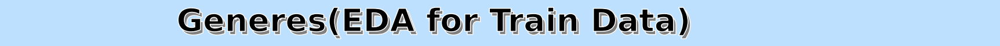

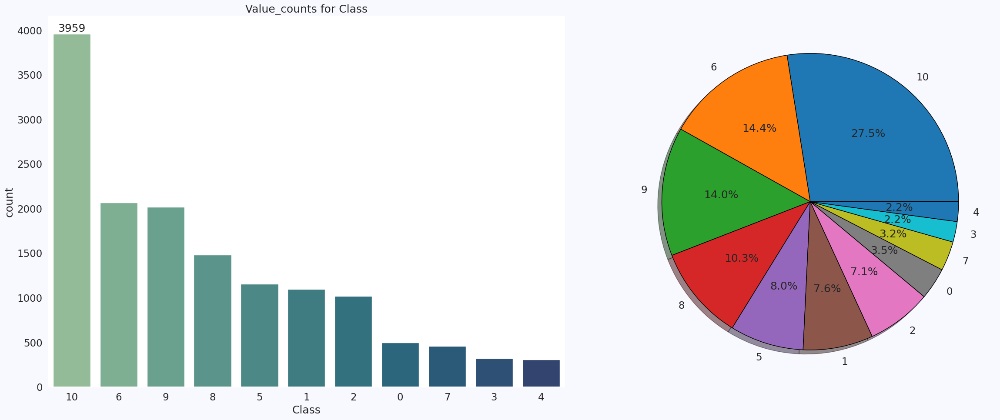

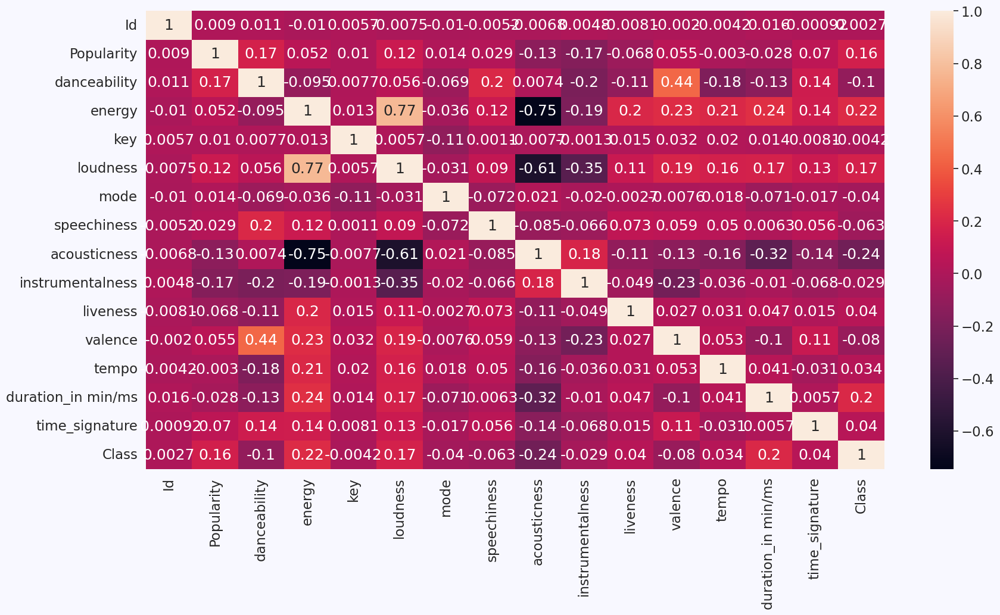

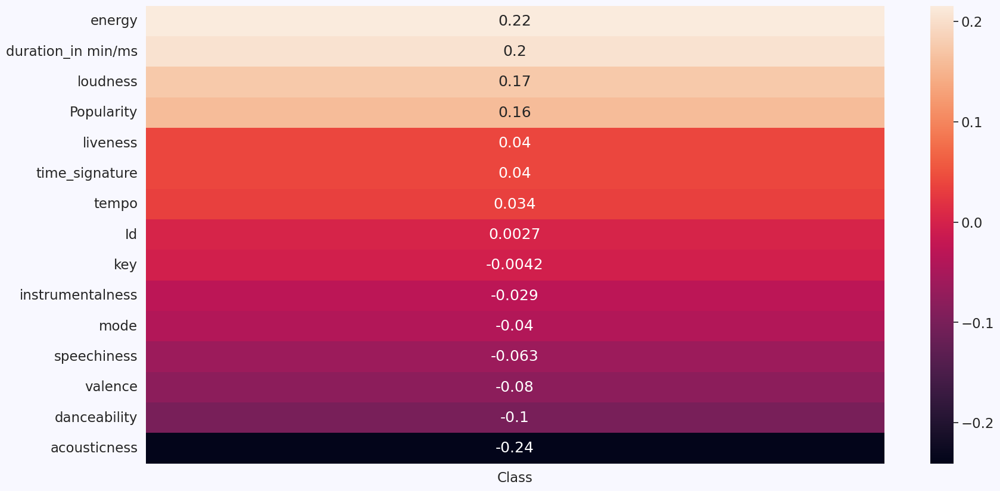

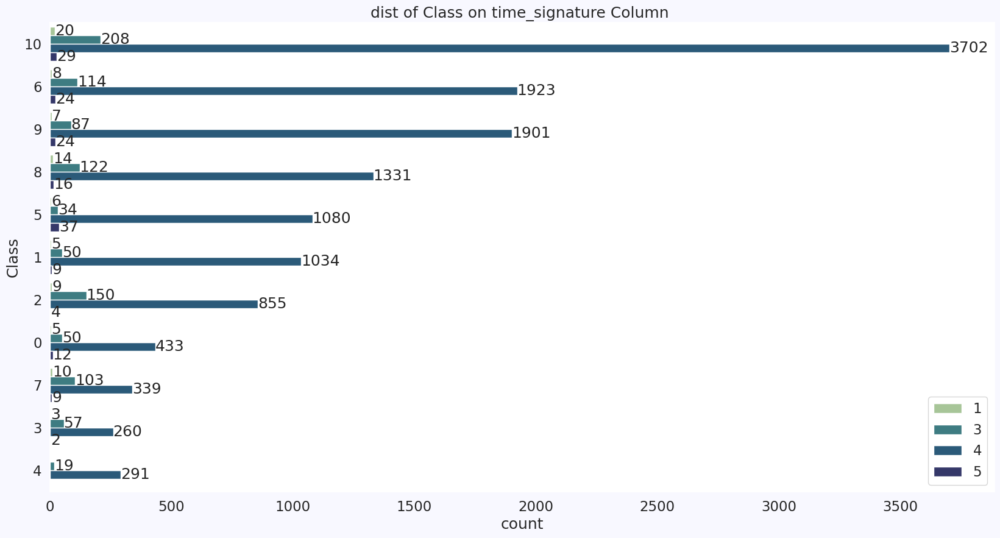

...

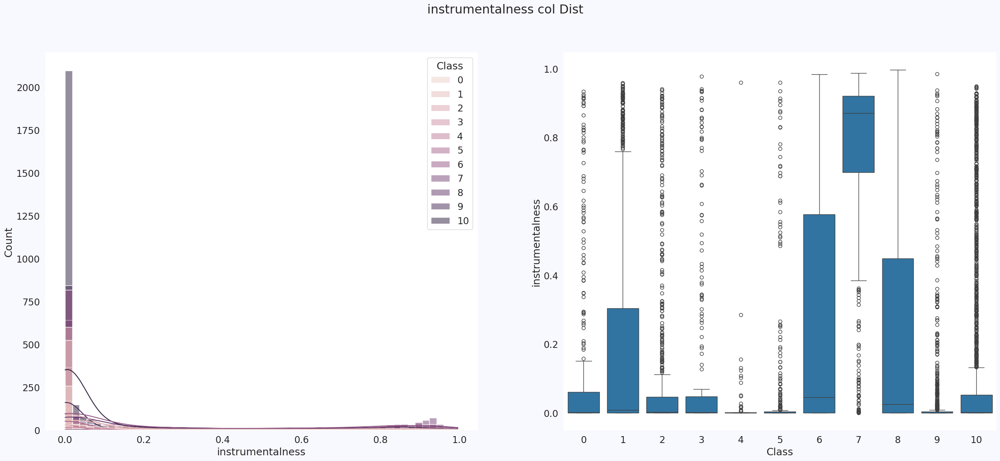

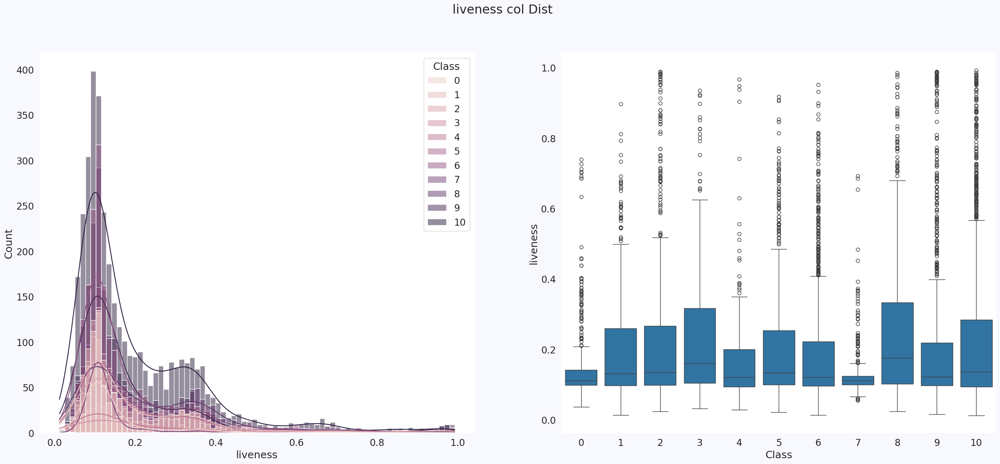

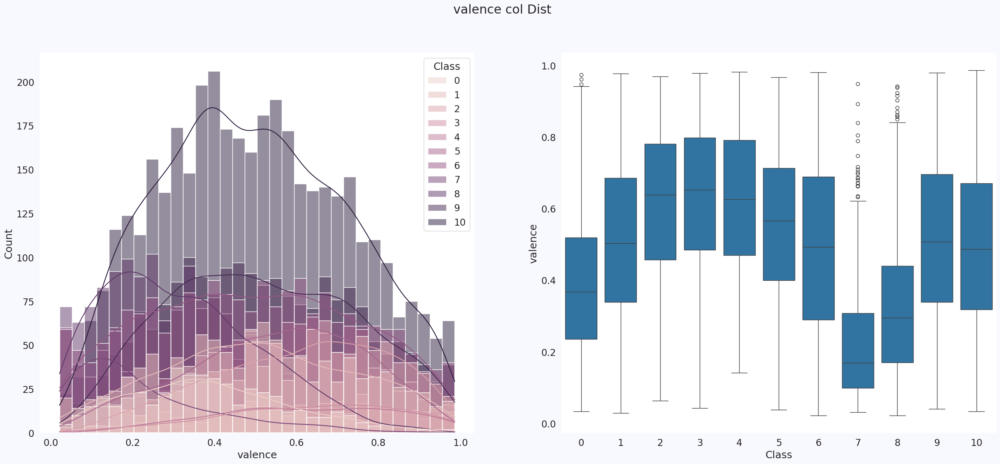

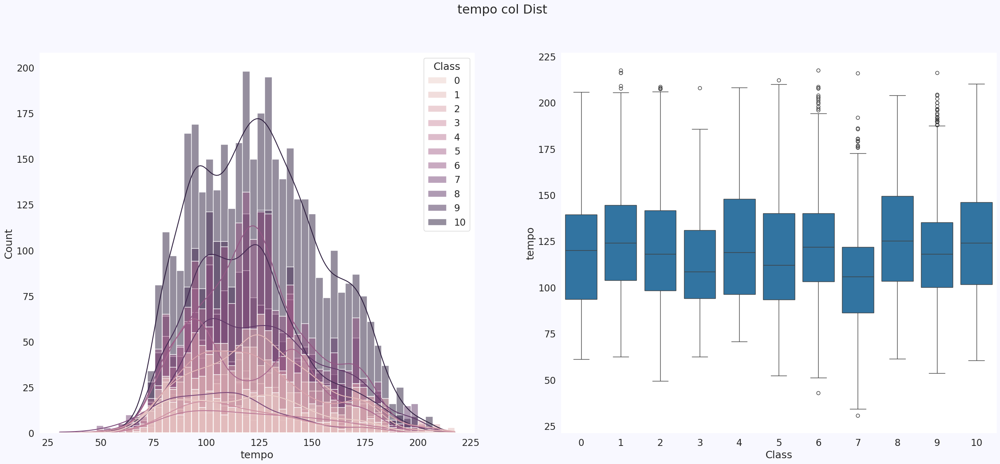

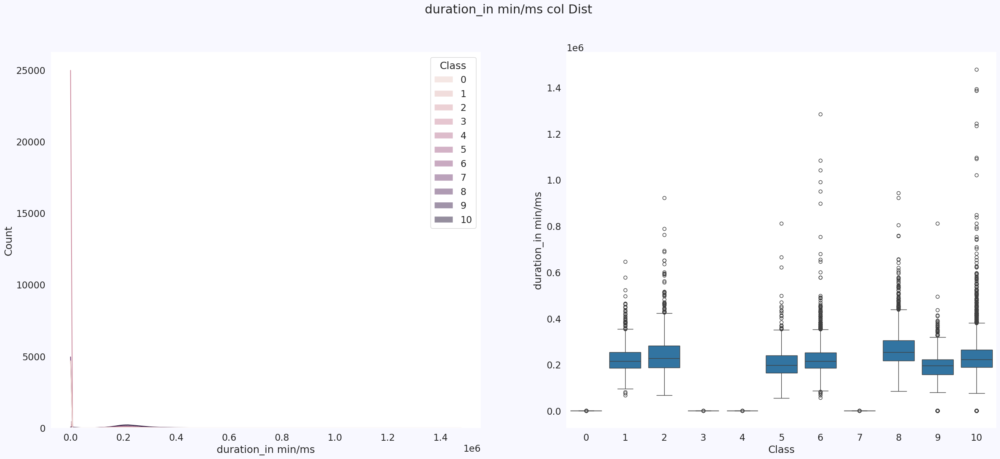

In [ ]:
label_txt(f'  Generes(EDA for Train Data)',w = 0.15)

cat_ana('Class',df_train)
plt.show()
plt.figure(figsize=(20,10))


sns.heatmap(df_train.select_dtypes(include=['float64', 'int64']).corr(),annot = True)
plt.figure(figsize=(20,10))

sns.heatmap(df_train.select_dtypes(include=['float64', 'int64']).corr()['Class'].drop('Class').sort_values(ascending=False).to_frame(),annot = True)


cat_count('Class',df_train,'time_signature','dist of Class on time_signature Column ')

label_txt(f'                Dist for Num Col',w = 0.15)


for i in num_feature:


    hist_box(i,df_train,'Class')

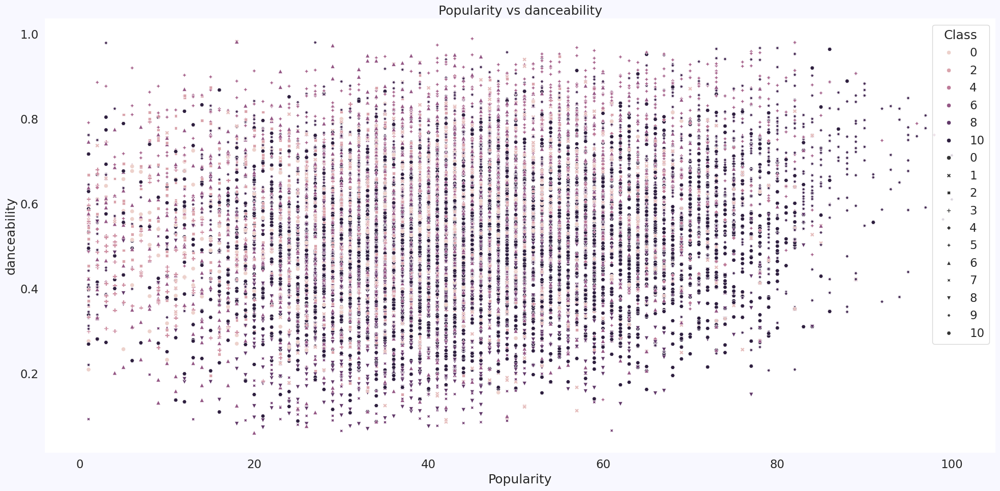

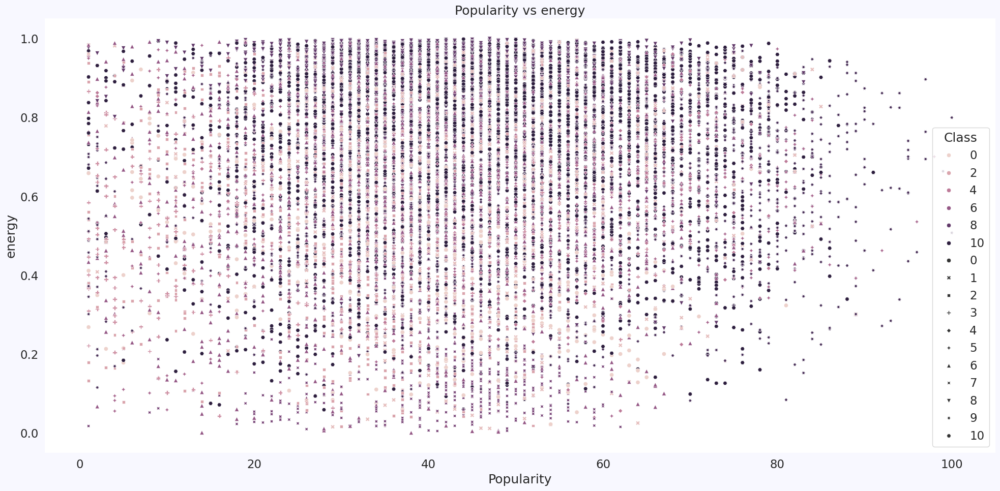

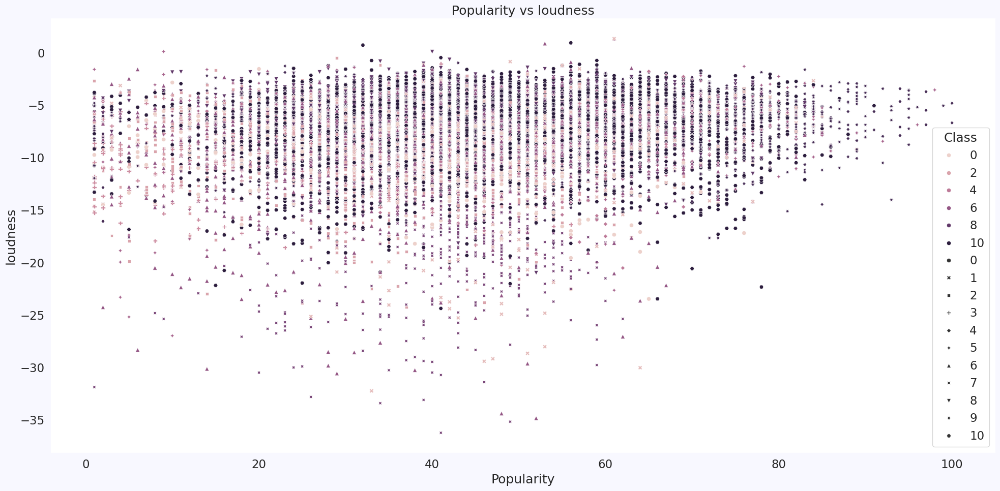

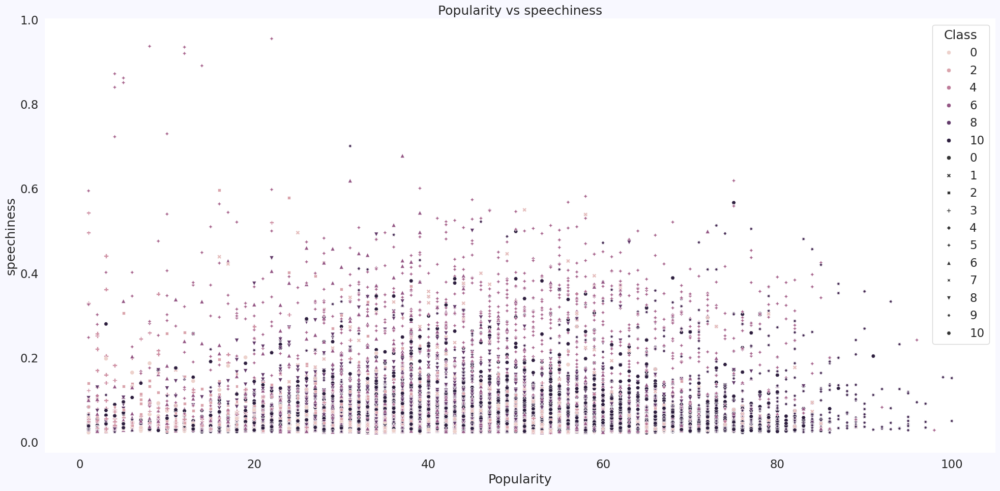

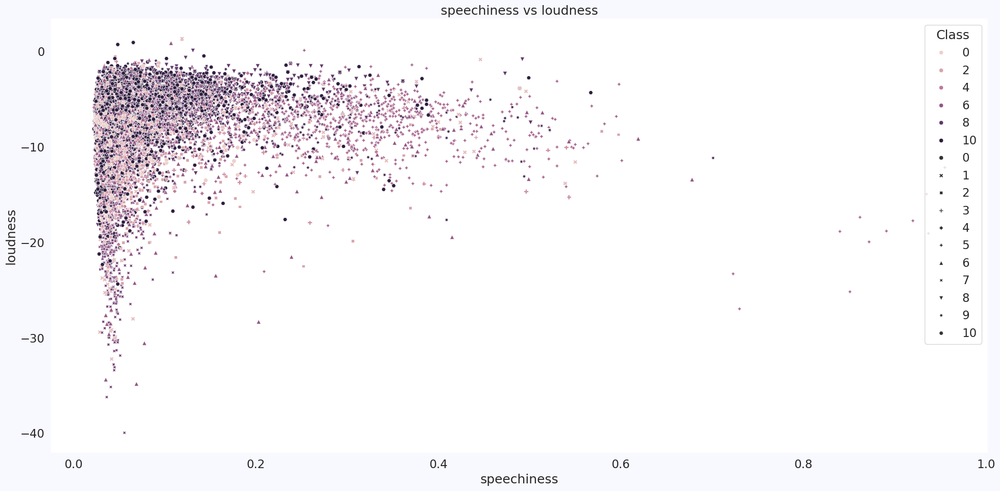

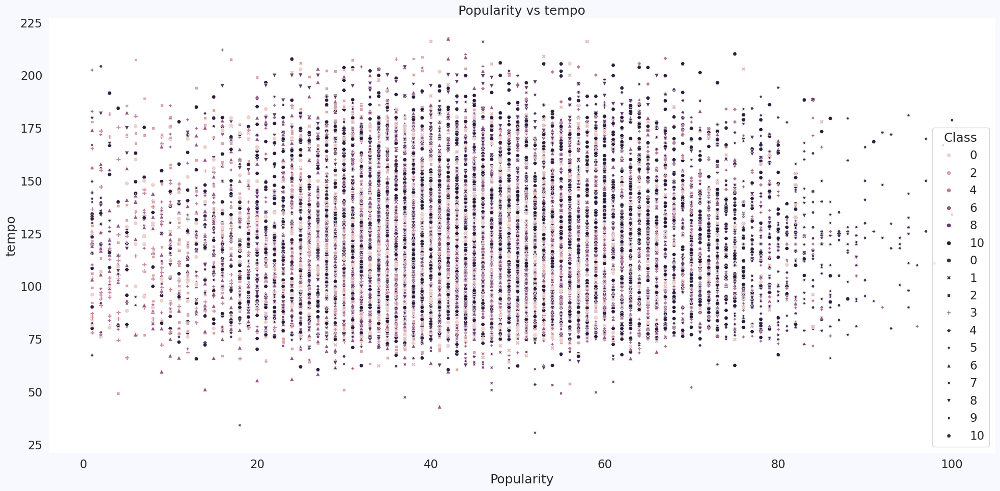

In [ ]:
scatter_df('Popularity','danceability',df_train,hue = 'Class')
scatter_df('Popularity','energy',df_train,hue = 'Class')

scatter_df('Popularity','loudness',df_train,hue = 'Class')
scatter_df('Popularity','speechiness',df_train,hue = 'Class')

scatter_df('speechiness','loudness',df_train,hue = 'Class')
scatter_df('Popularity','tempo',df_train,hue = 'Class')



<a id="2"></a>
# <span style="color:#0F52BA; font-family:serif; font-size:30px;">Train vs Test</span>


In [ ]:
def hist_df(row,col,df_tr,df_te):


    fig, axes = plt.subplots(row,col,figsize = (30,15))

    nu_col = 0
    fig.suptitle('Train vs Test Dist')
    for i in range(row):
        for c in range(col):
            sns.histplot(x = num_feature[nu_col],data = df_tr ,ax = axes[i][c],kde=True,label='Train')
            sns.histplot(x = num_feature[nu_col],data = df_te ,ax = axes[i][c],kde=True,label="Test")
            axes[i][c].legend()

            nu_col+=1
    plt.tight_layout()
    plt.show()
def stat_train_test(df_tr,df_te):
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    fig.suptitle('Train Statitics vs Test Statitics')
    g = sns.heatmap(df_tr[num_feature].describe().transpose(), annot=True, cmap='YlOrBr', fmt=".0f", cbar=False,ax=axs[0])
    g.set_title('Train Statitics')
    g = sns.heatmap(df_te[num_feature].describe().transpose(), annot=True, cmap='YlOrBr', fmt=".0f", cbar=False,ax=axs[1])
    g.set_title('Test Statitics')

    plt.tight_layout()
    plt.show()
def stat_train_test_heat(df_tr,df_te):
    fig, axs = plt.subplots(1,2,figsize = (25,10))

    fig.suptitle('Train Statitics vs Test HeatMap')
    g = sns.heatmap(df_tr.corr(), annot=True, cmap='YlOrBr', fmt=".2f", cbar=False,ax=axs[0])
    g.set_title('Train HeatMap')
    g = sns.heatmap(df_te.drop('Id',axis = 1).corr(), annot=True, cmap='YlOrBr', fmt=".2f", cbar=False,ax=axs[1])
    g.set_title('Test HeatMap')

    plt.tight_layout()
    plt.show()

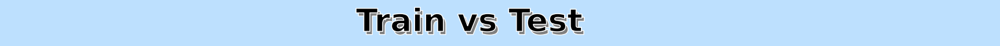

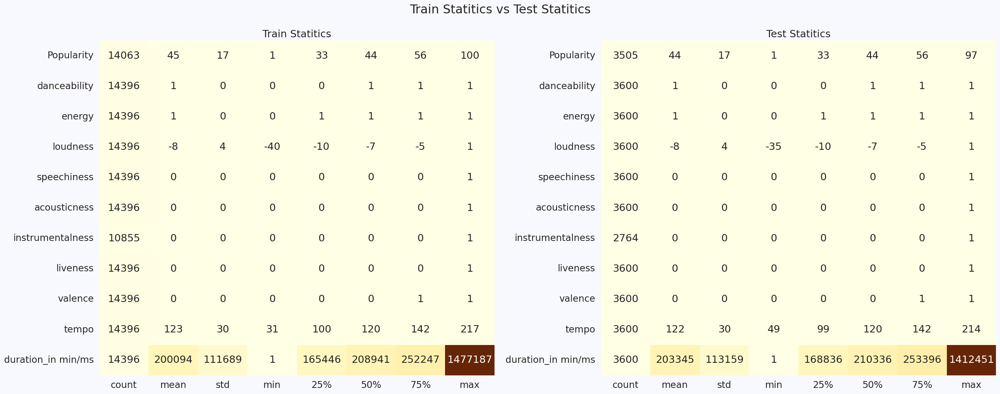

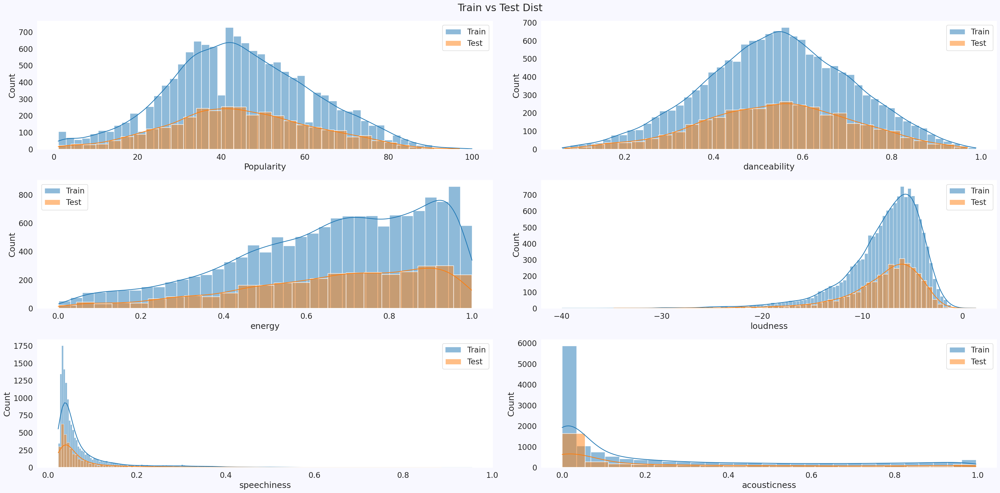

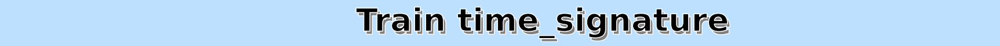

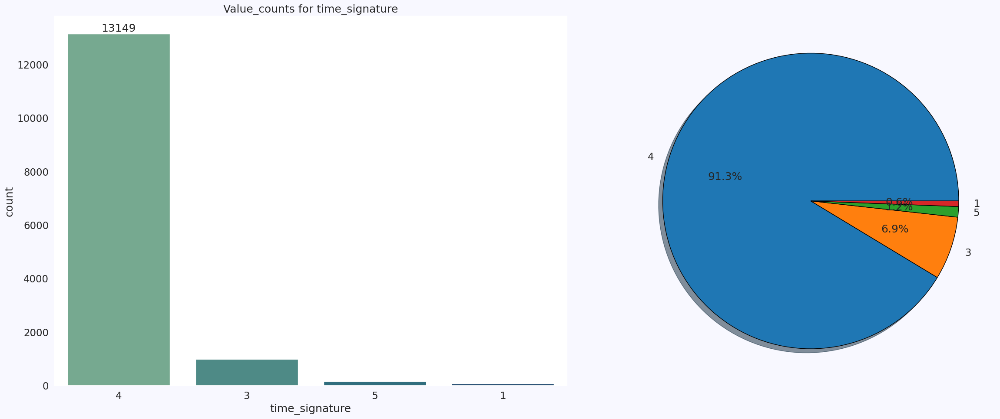

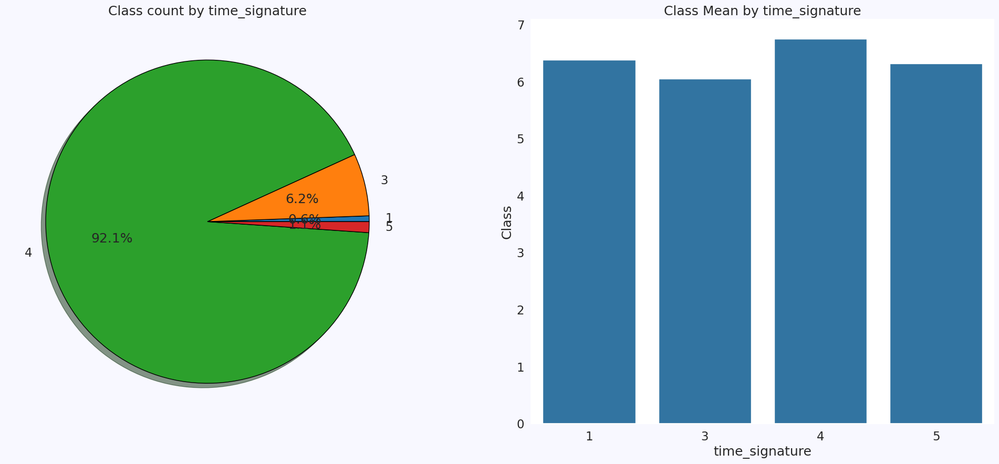

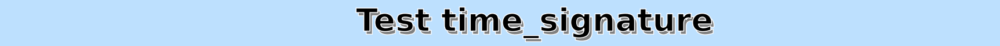

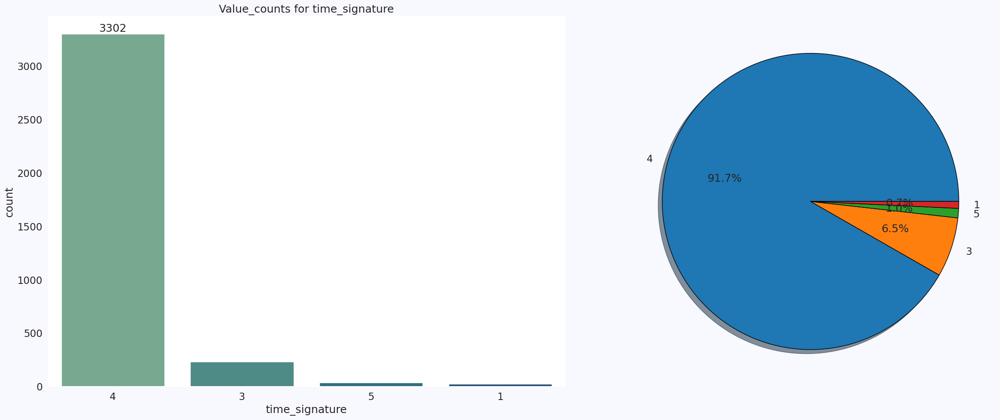

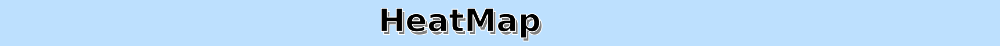

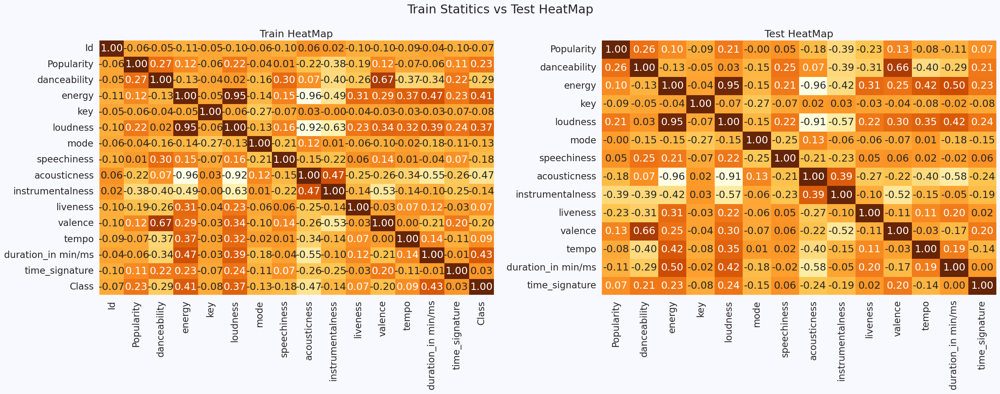

In [ ]:
label_txt(f'                  Train vs Test',w = 0.15)
stat_train_test(df_train,df_test)
hist_df(3,2,df_train,df_test)

label_txt(f'                  Train time_signature',w = 0.15)
cat_ana('time_signature',df_train)

fig, axes = plt.subplots(1,2,figsize = (25,10))

axes[0].pie(df_train.groupby('time_signature')[['Class']].aggregate('sum')['Class'].values , labels =df_train.groupby('time_signature')[['Class']].aggregate('sum')['Class'].index
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )


axes[0].set_title('Class count by time_signature')

sns.barplot(x = 'time_signature',y = 'Class',data = df_train,estimator=np.mean,ci = None ,ax = axes[1])
axes[1].set_title('Class Mean by time_signature')




label_txt(f'                  Test time_signature ',w = 0.15)
cat_ana('time_signature',df_test)







label_txt(f'                    HeatMap ',w = 0.15)

stat_train_test_heat(df_train.select_dtypes(include=['float64', 'int64']).corr(),df_test.select_dtypes(include=['float64', 'int64']).corr())




<a id="2"></a>
# <span style="color:#0F52BA; font-family:serif; font-size:30px;">Building Model And Pipeline</span>


In [ ]:
df_train.drop(columns = ["Id",'Artist Name',"Track Name","Genre"],inplace =True)
sdf_train.fillna(df_train.mean(),inplace =True)

In [ ]:
import pandas as pd
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler

def iterative_impute(df):

    # Copy the DataFrame to avoid modifying the original
    df_imputed = df.copy()

    # Standardize the data before imputation (optional but recommended for better performance)
    scaler = StandardScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df_imputed), columns=df_imputed.columns)

    # Create an Iterative Imputer object
    imputer = IterativeImputer(max_iter=10, random_state=0)

    # Fit and transform the data
    df_imputed_scaled = imputer.fit_transform(df_scaled)

    # Inverse transform to original scale
    df_imputed = scaler.inverse_transform(df_imputed_scaled)

    # Convert the result back to a DataFrame
    df_imputed = pd.DataFrame(df_imputed, columns=df.columns)

    return df_imputed


In [ ]:
X = df_train.drop(["Class"],axis = 1).copy()
y = df_train['Class']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.20,random_state=0)

In [ ]:
XS

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
0,37.000000,0.334,0.536,9.000000,-6.649,0,0.0381,0.378000,0.178129,0.1060,0.235,152.429,204947.000000,4
1,67.000000,0.725,0.747,11.000000,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4
2,44.525208,0.584,0.804,7.000000,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4
3,12.000000,0.515,0.308,5.953781,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3
4,48.000000,0.565,0.777,6.000000,-5.096,0,0.2490,0.183000,0.178129,0.2110,0.619,88.311,254145.000000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,47.000000,0.607,0.946,1.000000,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4
14392,27.000000,0.435,0.951,8.000000,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4
14393,22.000000,0.415,0.941,11.000000,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4
14394,37.000000,0.493,0.986,1.000000,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4


In [ ]:
from xgboost import XGBClassifier# XGBoost
from lightgbm import LGBMClassifier
import lightgbm as lgb  # LightGBM
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
model_dict = {

    'RandomForestClassifier': RandomForestClassifier(

    ),



    'AdaBoostClassifier': AdaBoostClassifier(

    ),
    'BaggingClassifier': BaggingClassifier (

    ),

    'ExtraTreesClassifier' : ExtraTreesClassifier(

    ),

    'GradientBoostingClassifier' : GradientBoostingClassifier(

    ),

    'HistGradientBoostingClassifier': HistGradientBoostingClassifier(

    ),

    'CatBoostClassifier' : CatBoostClassifier(
        silent=True
    ),

    'XGBClassifier': XGBClassifier(
                silent=True

    ),

    'LGBMClassifier': LGBMClassifier(
        silent=True

    )
}

In [4]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, ExtraTreesClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score

# Define the models
model_dict = {
    'RandomForestClassifier': RandomForestClassifier(),
    'AdaBoostClassifier': AdaBoostClassifier(),
    'BaggingClassifier': BaggingClassifier(),
    'ExtraTreesClassifier': ExtraTreesClassifier(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
    'HistGradientBoostingClassifier': HistGradientBoostingClassifier(),
    'CatBoostClassifier': CatBoostClassifier(silent=True),
    'XGBClassifier': XGBClassifier(silent=True),
    'LGBMClassifier': LGBMClassifier(silent=True)
}

# Define base classifiers and meta-classifier
base_classifiers = [(name, clf) for name, clf in model_dict.items()]
meta_classifier = LogisticRegression()  # Meta-learner

# Initialize Stacking Classifier
stacking_classifier = StackingClassifier(
    estimators=base_classifiers,
    final_estimator=meta_classifier,
    cv=5  # Cross-validation folds
)
stacking_classifier

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


StackingClassifier(cv=5,
                   estimators=[('RandomForestClassifier',
                                RandomForestClassifier()),
                               ('AdaBoostClassifier', AdaBoostClassifier()),
                               ('BaggingClassifier', BaggingClassifier()),
                               ('ExtraTreesClassifier', ExtraTreesClassifier()),
                               ('GradientBoostingClassifier',
                                GradientBoostingClassifier()),
                               ('HistGradientBoostingClassifier',
                                HistGradientBoostingClassifier()),...
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=None, ...)),
                               ('LGBMClassifier', LGBMClassifier(silent=True))],
                   final_estimator=LogisticRegression())

In [3]:
pip install scikit-learn catboost xgboost lightgbm


In [ ]:
from sklearn.metrics import roc_auc_score,roc_curve

model_name = []
model_cv = []

model_ypred = []


for i in model_dict:

    model = model_dict[i]

    scores = cross_val_score(model,X_train,y_train,cv = 4)
    print(f'{i} Avg_Cv Score is  {np.mean(scores)}')


    model.fit(X_train,y_train)



    model_name.append(i)
    model_cv.append(np.mean(scores))


    y_pred = model.predict(X_test)


    model_ypred.append(y_pred)

    print('-' * 30)


RandomForestClassifier Avg_Cv Score is  0.5120701632511289
------------------------------
AdaBoostClassifier Avg_Cv Score is  0.3539423410906565
------------------------------
BaggingClassifier Avg_Cv Score is  0.45423758249392143
------------------------------
ExtraTreesClassifier Avg_Cv Score is  0.5012156998957971
------------------------------
GradientBoostingClassifier Avg_Cv Score is  0.5285689475512331
------------------------------
HistGradientBoostingClassifier Avg_Cv Score is  0.5127648489058702
------------------------------
CatBoostClassifier Avg_Cv Score is  0.5191906912122264
------------------------------
XGBClassifier Avg_Cv Score is  0.5052969781174019
------------------------------
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `

In [ ]:

dict_model_info = {
    'CV Score':model_cv,


}

df_model_eva = pd.DataFrame(dict_model_info ,index = model_name)
df_model_eva.sort_values(['CV Score'],axis = 0,ascending = False)

,CV Score
GradientBoostingClassifier,0.528569
CatBoostClassifier,0.519191
HistGradientBoostingClassifier,0.512765
RandomForestClassifier,0.512070
LGBMClassifier,0.511028
XGBClassifier,0.505297
ExtraTreesClassifier,0.501216
BaggingClassifier,0.454238
AdaBoostClassifier,0.353942


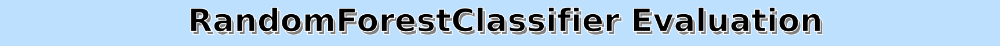

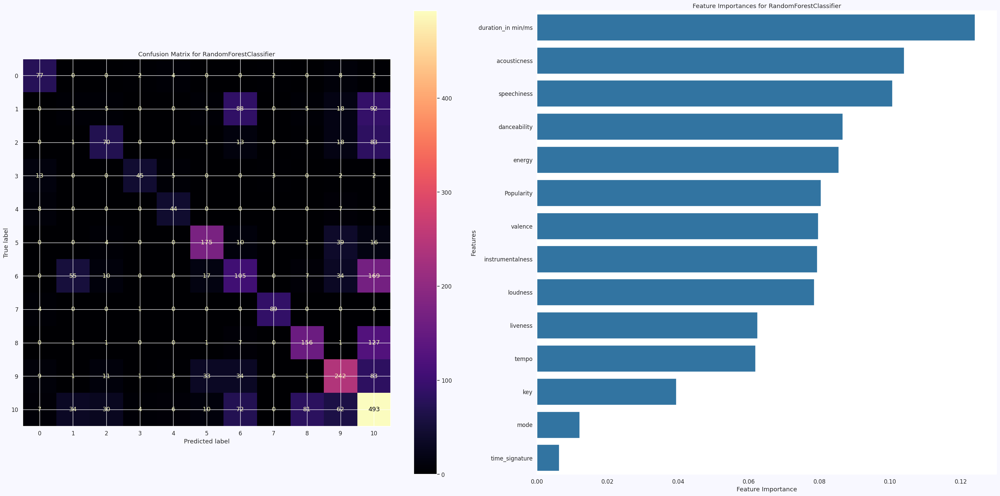

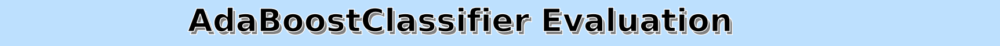

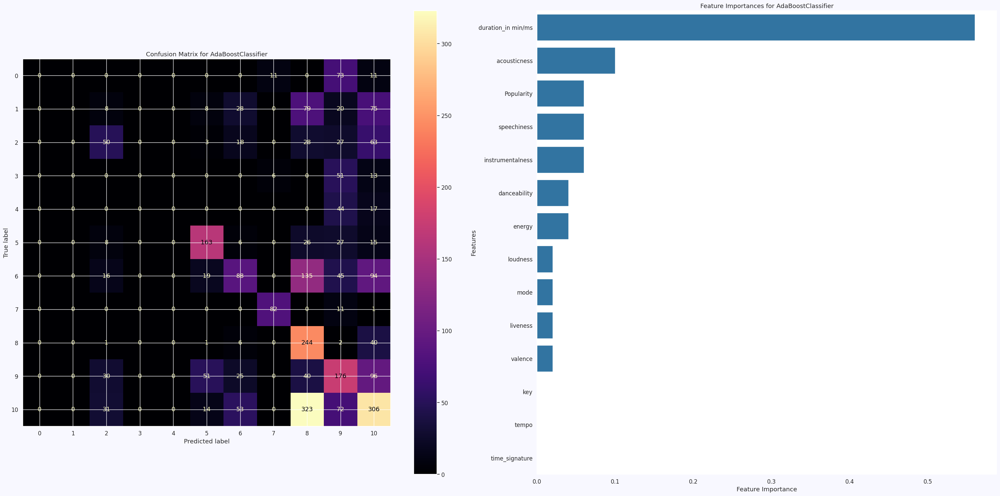

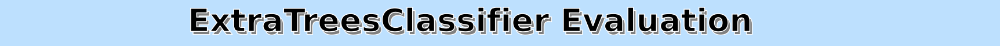

...

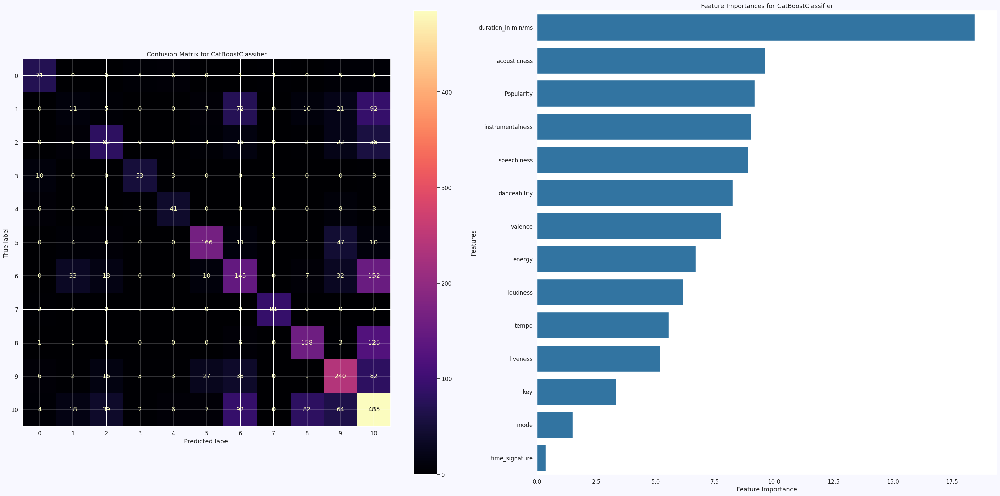

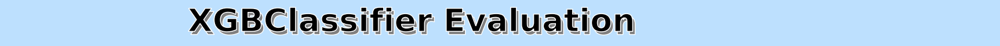

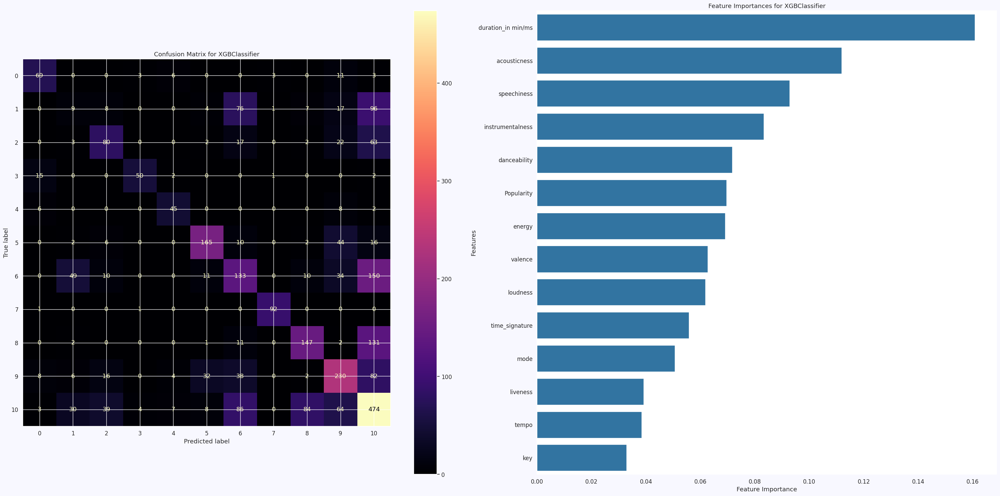

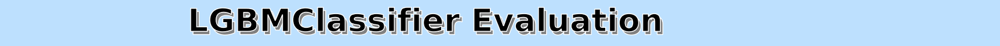

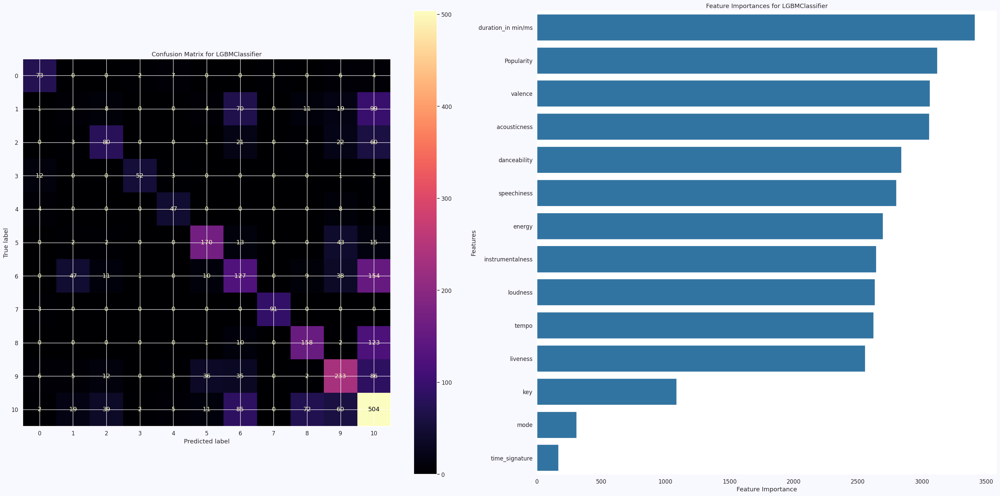

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

for i in range(len(list(model_dict))):

    if list(model_dict)[i] in ['BaggingClassifier','LogisticRegression','HistGradientBoostingClassifier']:
        continue


    # Display model evaluation title
    label_txt(f'   {list(model_dict)[i]} Evaluation', w=0.15)

    # Create subplots for confusion matrix and feature importance
    fig, axes = plt.subplots(1, 2, figsize=(30, 15), dpi=100)

    # Set visual styles
    sns.set_context('notebook', font_scale=1.1)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'

    # Plot confusion matrix
    ConfusionMatrixDisplay(confusion_matrix(y_test, model_ypred[i])).plot(cmap='magma', ax=axes[0])
    axes[0].set_title(f'Confusion Matrix for {list(model_dict)[i]}')

    # Plot feature importances
    axes[1].clear()
    feature_importances = model_dict[list(model_dict)[i]].feature_importances_
    sorted_indices = np.argsort(-feature_importances)
    sns.barplot(y=X_train.columns[sorted_indices], x=feature_importances[sorted_indices], ax=axes[1])

    axes[1].set_title(f'Feature Importances for {list(model_dict)[i]}')
    axes[1].set_xlabel('Feature Importance')
    axes[1].set_ylabel('Features')

    plt.tight_layout()
    plt.show()


In [ ]:
from xgboost import XGBClassifier# XGBoost

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }



xgb = XGBClassifier(
learning_rate=0.01, n_estimators=700, objective='binary:logistic',
                    silent=False, nthread=11
)




In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV

params = {
    'depth': [3, 4, 5],  # Equivalent to max_depth in XGBoost
    'learning_rate': [0.01],  # Same learning rate as in XGBoost
    'iterations': [700],  # Equivalent to n_estimators in XGBoost
    'l2_leaf_reg': [1, 5, 10],  # Equivalent to min_child_weight in XGBoost
    'border_count': [32, 50, 100],  # Related to gamma in XGBoost (although not directly equivalent)
    'subsample': [0.6, 0.8, 1.0],  # Equivalent to subsample in XGBoost
    'colsample_bylevel': [0.6, 0.8, 1.0]  # Equivalent to colsample_bytree in XGBoost
}

# Initialize the CatBoostClassifier
catboost = CatBoostClassifier(
    learning_rate=0.01,

)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=catboost,
    param_grid=params,
    scoring='accuracy',
    cv=5,
    verbose=1
)


In [ ]:
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=700, n_jobs=None, nthread=11,
              num_parallel_tree=None, ...)